In [210]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import classification_report

from warnings import filterwarnings
filterwarnings('ignore')

In [211]:
df = pd.read_csv('HR-Employee-Attrition.csv')

In [212]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


# Preprocessing

In [213]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [214]:
# there is no null values so we will continue to handling outliers

In [215]:
num_cols = df.select_dtypes(include=['float64','int64']).columns
for col in num_cols:
    fig1 = px.box(df,y=col,title = f'box plot for {col}')
    fig1.update_layout(
        width = 800,
        height = 600,
        margin = dict(r=50,l=50,t=25,b=25),
        title = dict(text = f'<b> box plot for {col}</b>')
    )
    fig1.show()

In [216]:
for col in num_cols:
    Q3 = df[col].quantile(0.85)
    Q1 = df[col].quantile(0.25)
    IQR = Q3 - Q1
    print(col)
    print(Q3)
    print('upper bound: ', Q3 + 1.5*IQR)
    print("---------------------")

Age
47.0
upper bound:  72.5
---------------------
DailyRate
1297.0
upper bound:  2545.0
---------------------
DistanceFromHome
20.0
upper bound:  47.0
---------------------
Education
4.0
upper bound:  7.0
---------------------
EmployeeCount
1.0
upper bound:  1.0
---------------------
EmployeeNumber
1751.6499999999999
upper bound:  3642.25
---------------------
EnvironmentSatisfaction
4.0
upper bound:  7.0
---------------------
HourlyRate
90.0
upper bound:  153.0
---------------------
JobInvolvement
3.0
upper bound:  4.5
---------------------
JobLevel
3.0
upper bound:  6.0
---------------------
JobSatisfaction
4.0
upper bound:  7.0
---------------------
MonthlyIncome
10927.8
upper bound:  22953.0
---------------------
MonthlyRate
22823.95
upper bound:  44989.375
---------------------
NumCompaniesWorked
6.0
upper bound:  13.5
---------------------
PercentSalaryHike
20.0
upper bound:  32.0
---------------------
PerformanceRating
4.0
upper bound:  5.5
---------------------
RelationshipSati

In [217]:
for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.85)

    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5*IQR
    upper_bound = Q3 + 1.5*IQR

    df[col] = np.where((df[col]< lower_bound)|(df[col]>upper_bound),df[col].mean(),df[col])

    

In [218]:
num_cols = df.select_dtypes(include=['float64','int64']).columns
for col in num_cols:
    fig1 = px.box(df,y=col,title = f'box plot for {col}')
    fig1.update_layout(
        width = 800,
        height = 600,
        margin = dict(r=50,l=50,t=25,b=25),
        title = dict(text = f'<b> box plot for {col}</b>')
    )
    fig1.show()

# Exploratory Data Analysis

## Categorical variables

In [219]:
cat_cols = df.select_dtypes(include = ['object']).columns

In [220]:
for col in cat_cols:
    fig2 = px.pie(df,names=col, title = f'pie char for {col}')
    fig2.update_layout(
        width = 800,
        height = 600,
        margin = dict(r=50,l=50,t=50,b=50),
        title = dict(text= f'pie char for{col}',x= 0.5)
    )
    fig2.show()

In [221]:
for col in cat_cols.drop('Attrition'):
    fig3 = px.histogram(df, x = col, color = 'Attrition',barmode = 'group', title = f'distribution of {col} Vs Attrition')
    fig3.update_layout(
        width = 800,
        height = 600,
        margin = dict(r=50,l=50,t=50,b=50),
        title = dict(text = f'<b>Distribution of {col} VS Attrition</b>',x = 0.5)
    )
    fig3.show()

## numerical columns

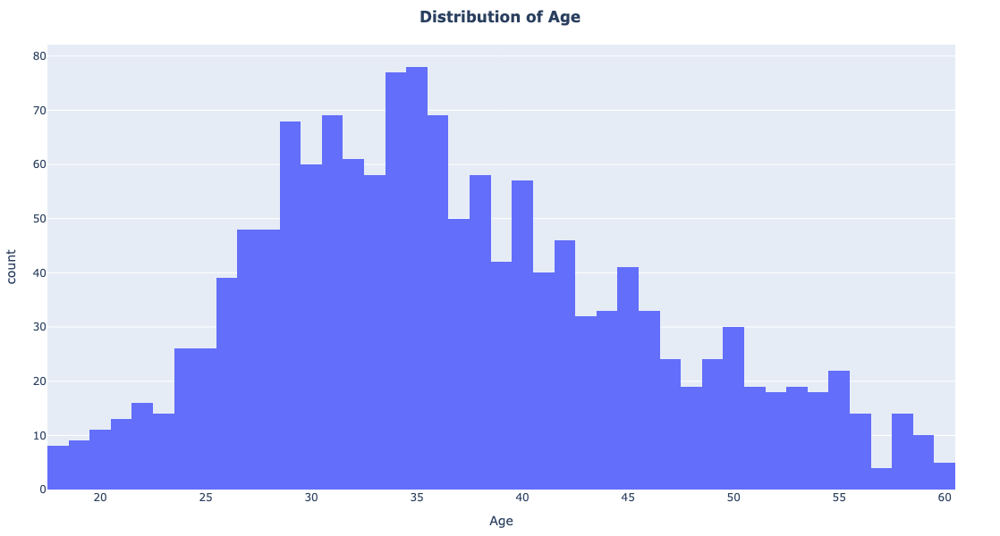

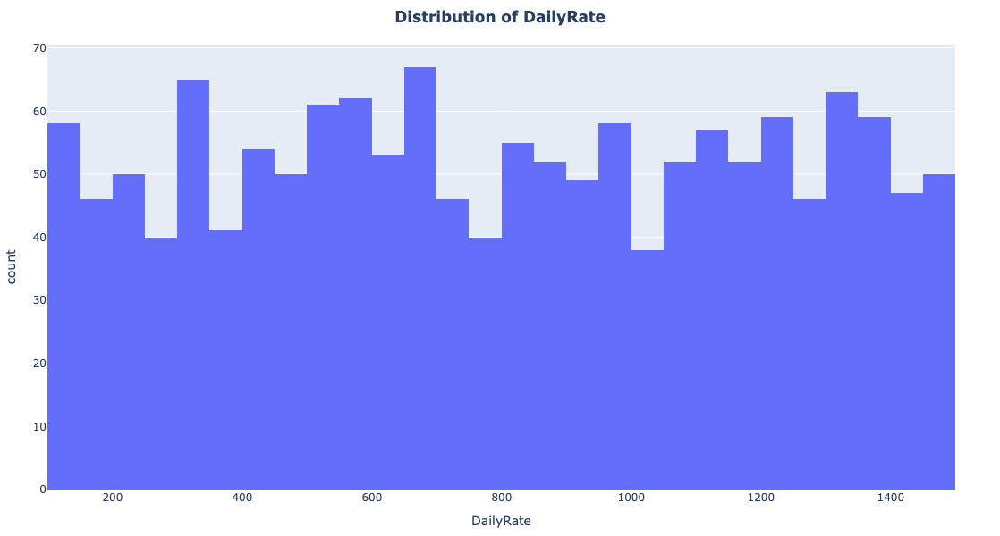

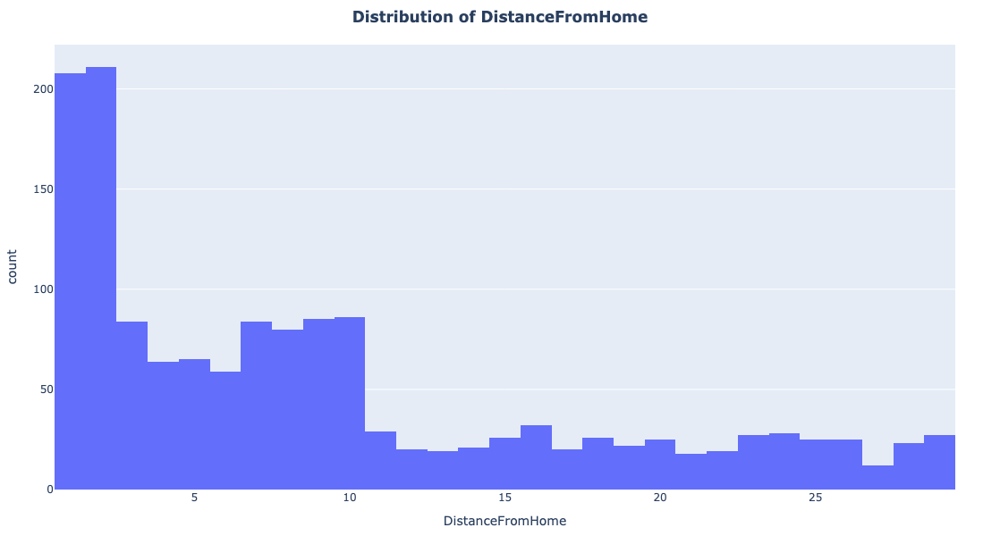

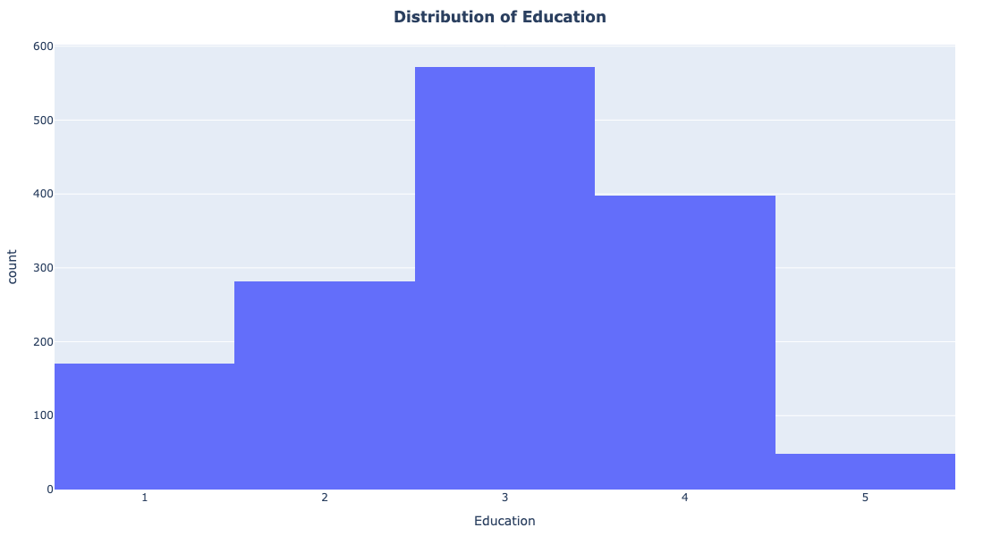

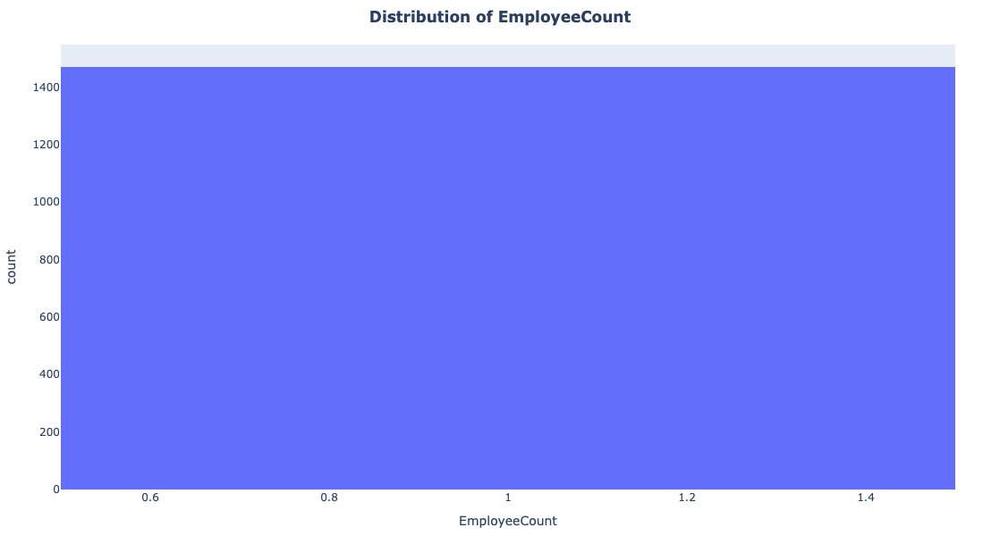

...

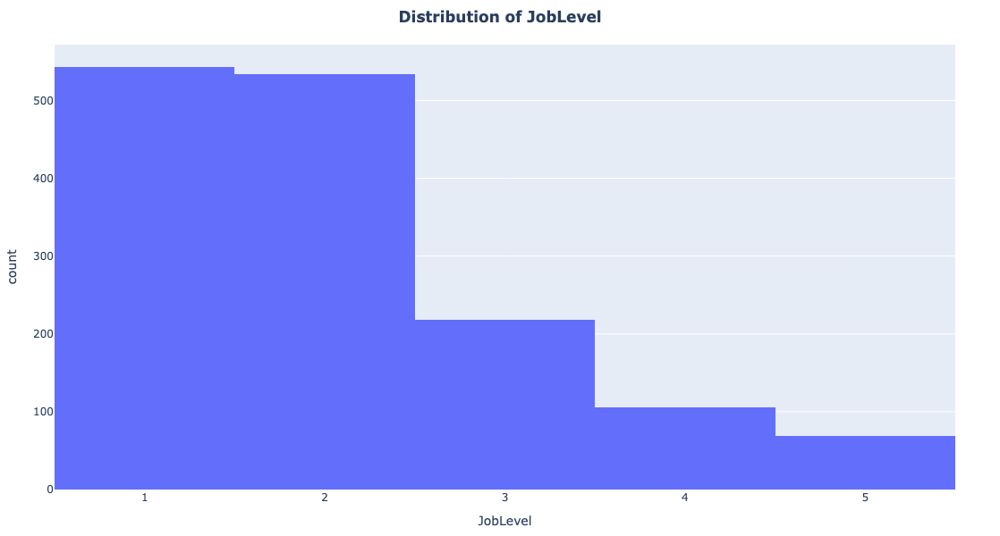

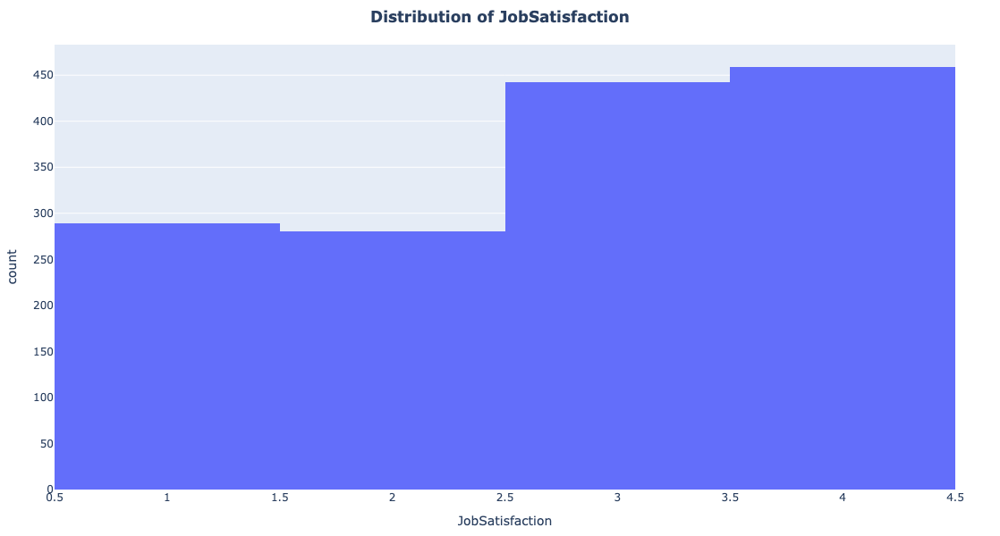

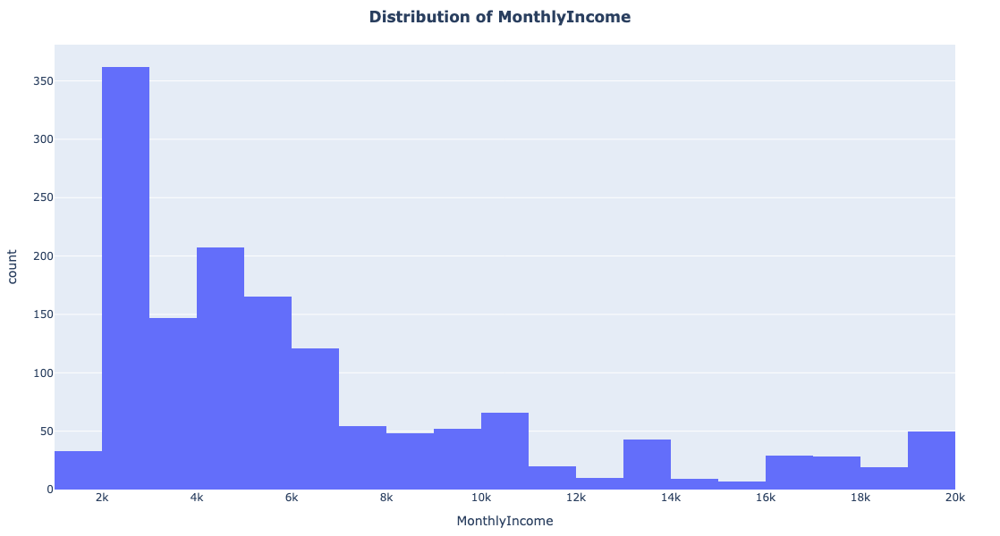

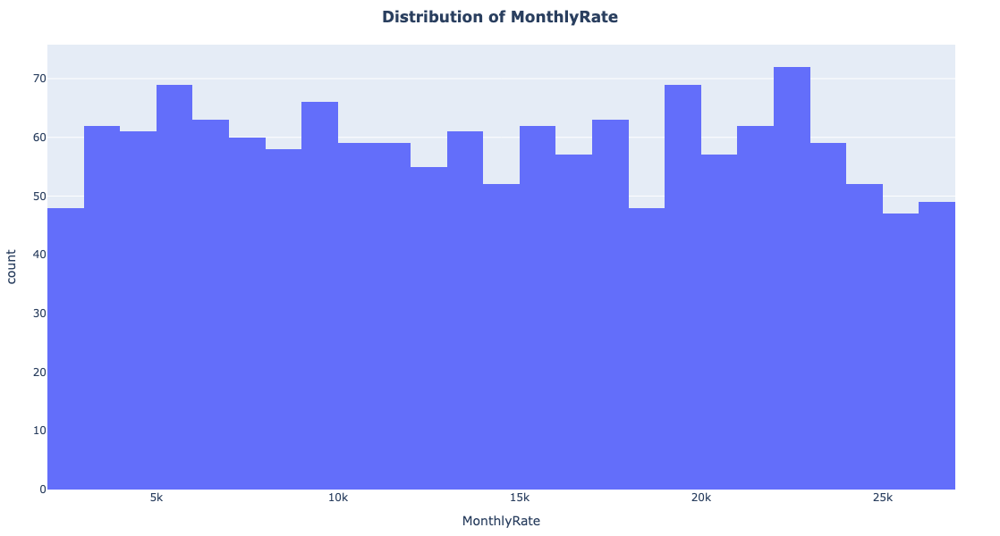

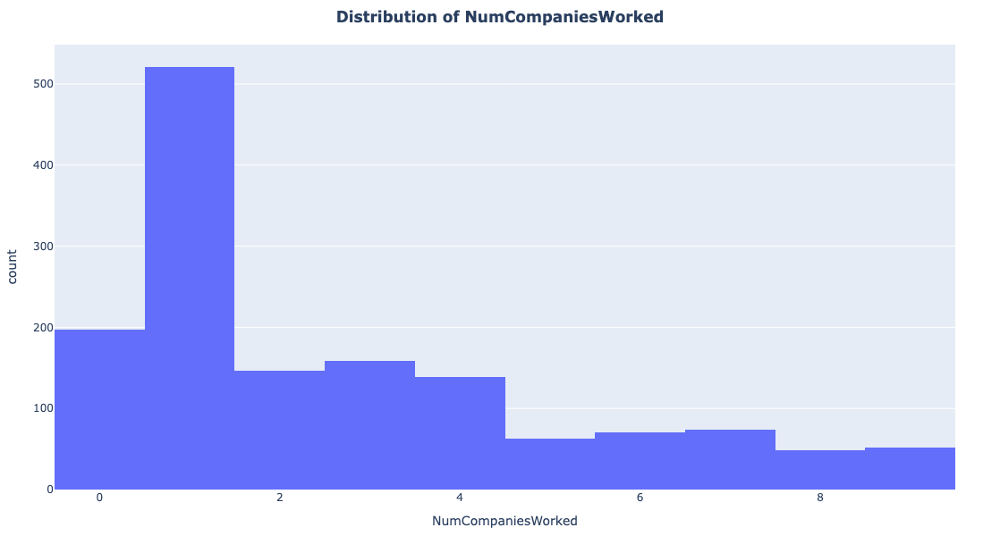

In [222]:
for col in num_cols:
    fig4 = px.histogram(df, x = col, title = f'Distribution of {col}')
    fig4.update_layout(
        width = 800,
        height = 600,
        margin = dict(r=50,l=50,t=50,b=50),
        title = dict(text = f'<b>Distribution of {col}</b>',x = 0.5)
    )
    fig4.show()

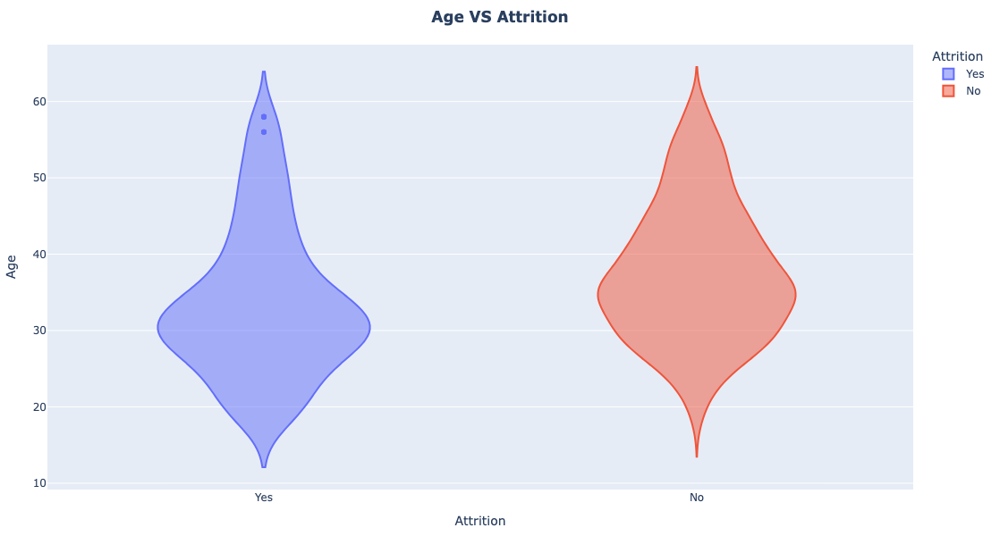

In [223]:
for col in num_cols:
    fig4 = px.violin(df, x = 'Attrition',y=col, color = 'Attrition',title = f'{col} VS Attrition')
    fig4.update_layout(
        width = 800,
        height = 600,
        margin = dict(r=50,l=50,t=50,b=50),
        title = dict(text = f'<b>{col} VS Attrition</b>',x = 0.5)
    )
    fig4.show()

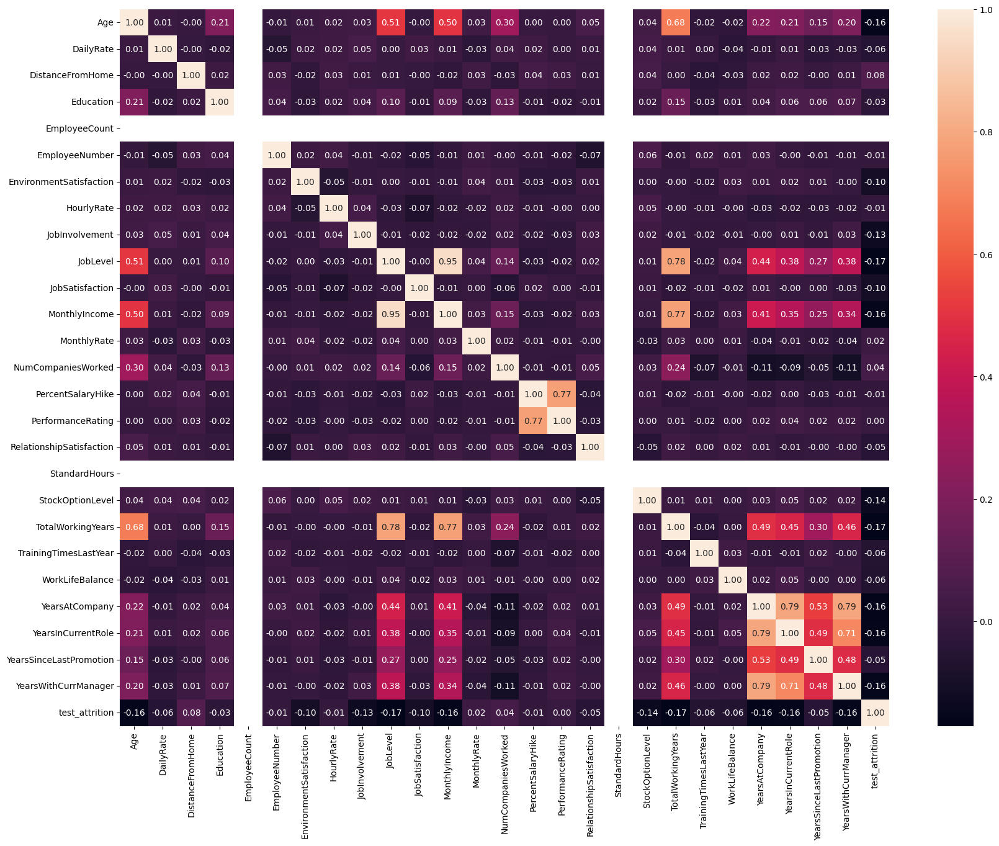

In [224]:
plt.figure(figsize=(20,15))
df['test_attrition'] = df['Attrition'].map({'Yes':1,'No':0})
num_cols = df.select_dtypes(include = ['float64','int64']).columns
sns.heatmap(df[num_cols].corr(),annot=True,fmt = '.2f')
df.drop('test_attrition',axis=1,inplace = True)

In [225]:
df.drop(['EmployeeNumber','EmployeeCount','HourlyRate','JobSatisfaction','MonthlyRate','PercentSalaryHike',
         'PerformanceRating','RelationshipSatisfaction','StandardHours','StockOptionLevel','TrainingTimesLastYear',
        'WorkLifeBalance'],axis=1,inplace= True)

# Preperation for modeling

## Handel categorical values

In [226]:
for col in cat_cols:
    print(col)
    print(df[col].unique())
    print(len(df[col].unique()))
    print('---------------------')

Attrition
['Yes' 'No']
2
---------------------
BusinessTravel
['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']
3
---------------------
Department
['Sales' 'Research & Development' 'Human Resources']
3
---------------------
EducationField
['Life Sciences' 'Other' 'Medical' 'Marketing' 'Technical Degree'
 'Human Resources']
6
---------------------
Gender
['Female' 'Male']
2
---------------------
JobRole
['Sales Executive' 'Research Scientist' 'Laboratory Technician'
 'Manufacturing Director' 'Healthcare Representative' 'Manager'
 'Sales Representative' 'Research Director' 'Human Resources']
9
---------------------
MaritalStatus
['Single' 'Married' 'Divorced']
3
---------------------
Over18
['Y']
1
---------------------
OverTime
['Yes' 'No']
2
---------------------


In [227]:
df['Attrition'] = df['Attrition'].map({'Yes':1,'No':0})
df['OverTime'] = df['OverTime'].map({'Yes':1,'No':0})

In [228]:
df.drop('Over18',axis=1,inplace= True)

In [229]:
cat_cols = df.select_dtypes(['object']).columns
num_cols = df.select_dtypes(['float64','int64']).columns

In [230]:
for col in cat_cols:
    print(col)
    print(df[col].unique())
    print(len(df[col].unique()))
    print('---------------------')

BusinessTravel
['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']
3
---------------------
Department
['Sales' 'Research & Development' 'Human Resources']
3
---------------------
EducationField
['Life Sciences' 'Other' 'Medical' 'Marketing' 'Technical Degree'
 'Human Resources']
6
---------------------
Gender
['Female' 'Male']
2
---------------------
JobRole
['Sales Executive' 'Research Scientist' 'Laboratory Technician'
 'Manufacturing Director' 'Healthcare Representative' 'Manager'
 'Sales Representative' 'Research Director' 'Human Resources']
9
---------------------
MaritalStatus
['Single' 'Married' 'Divorced']
3
---------------------


In [311]:
df_encoded = pd.get_dummies(df,columns= cat_cols, drop_first=True,dtype=float)

<Axes: >

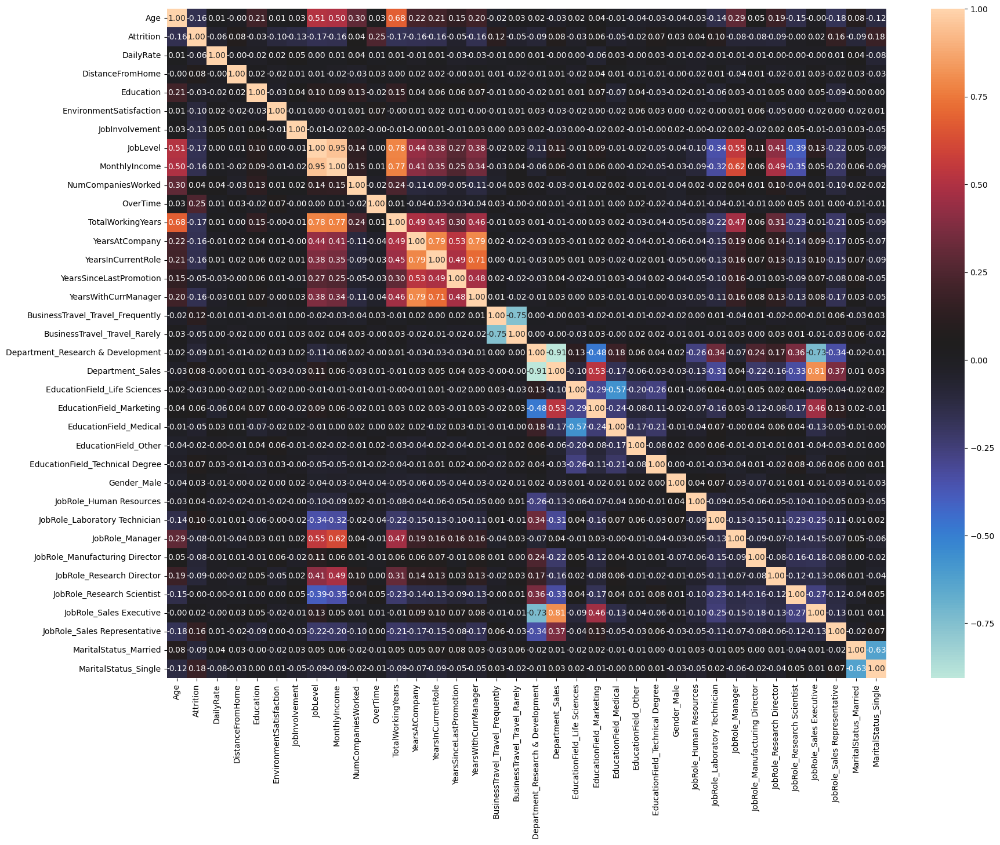

In [232]:
plt.figure(figsize=(20,15))
sns.heatmap(df_encoded.corr(),annot=True,fmt = '.2f',cmap='icefire')

## spliting and scaling

In [312]:
X = df_encoded.drop('Attrition', axis=1) 
y = df_encoded['Attrition']               

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [313]:
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Modeling

In [286]:
from sklearn.model_selection import GridSearchCV
rf = RandomForestClassifier(random_state=42)

# Define parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Perform Grid Search with 5-fold cross-validation
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

# Best hyperparameters and score
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Cross-validation Score: {grid_search.best_score_}")

# Evaluate on the test set
best_rf = grid_search.best_estimator_
test_score = best_rf.score(X_test, y_test)
print(f"Test Score: {test_score}")

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   0.0s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.0s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1

In [288]:
model0 = RandomForestClassifier(**grid_search.best_params_)
model0.fit(X_train,y_train)

RandomForestClassifier(max_depth=10, min_samples_split=5, n_estimators=50)

In [289]:
predictions0 = model0.predict(X_test)

In [290]:
print(classification_report(y_test, predictions0))

              precision    recall  f1-score   support

           0       0.88      1.00      0.93       255
           1       0.80      0.10      0.18        39

    accuracy                           0.88       294
   macro avg       0.84      0.55      0.56       294
weighted avg       0.87      0.88      0.83       294



In [291]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix

In [292]:
print(accuracy_score(y_test,predictions0))
print(roc_auc_score(y_test, predictions0))

0.8775510204081632
0.5493212669683258


In [293]:
confusion_matrix(y_test, predictions0)

array([[254,   1],
       [ 35,   4]])

In [294]:
feature_importance_df = pd.DataFrame(data = model0.feature_importances_,columns= ['feature_importance'], index= X.columns)

In [295]:
feature_importance_df = feature_importance_df.sort_values(by = 'feature_importance',ascending= False)
feature_importance_df

,feature_importance
MonthlyIncome,0.107253
OverTime,0.089460
Age,0.079699
DailyRate,0.070105
TotalWorkingYears,0.064139
DistanceFromHome,0.057919
YearsAtCompany,0.049698
NumCompaniesWorked,0.047895
YearsWithCurrManager,0.043778
MaritalStatus_Single,0.042841


In [296]:
import shap

In [297]:
explainer = shap.TreeExplainer(model0,X_train)
shap_values = explainer.shap_values(X_test,check_additivity= False)

In [298]:
shap_values.shape

(294, 35, 2)

In [299]:
shap_values_reduced = shap_values[:, :, 0]

In [300]:
shap_values_reduced.shape

(294, 35)

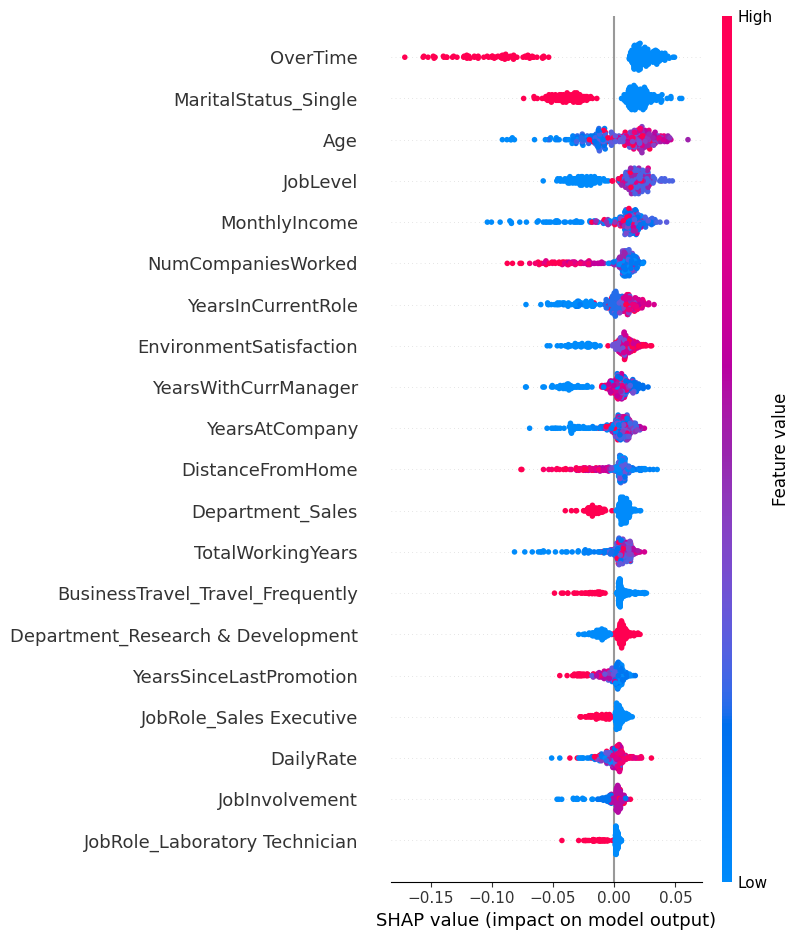

In [301]:
shap.summary_plot(shap_values_reduced,X_test, feature_names = X.columns)

In [302]:
shap_values_df = pd.DataFrame(shap_values_reduced, columns=X.columns)
shap_values_mean = shap_values_df.abs().mean()

In [303]:
shap_values_mean.sort_values(ascending=False,inplace=True)
shap_values_mean

OverTime                             0.044813
MaritalStatus_Single                 0.027851
Age                                  0.022151
JobLevel                             0.021235
MonthlyIncome                        0.019148
NumCompaniesWorked                   0.017236
YearsInCurrentRole                   0.014500
EnvironmentSatisfaction              0.013391
YearsWithCurrManager                 0.013241
YearsAtCompany                       0.011947
DistanceFromHome                     0.011743
Department_Sales                     0.010632
TotalWorkingYears                    0.010609
BusinessTravel_Travel_Frequently     0.009463
Department_Research & Development    0.008722
YearsSinceLastPromotion              0.007271
JobRole_Sales Executive              0.006585
DailyRate                            0.006337
JobInvolvement                       0.005202
JobRole_Laboratory Technician        0.004462
BusinessTravel_Travel_Rarely         0.004188
EducationField_Marketing          

[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50; total time=   0.1s
[CV] END max_depth=10, max_features=sqrt, mi